In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

from tensorflow import keras

# TURN OFF tf2's EAGER EXEC 
tf.compat.v1.disable_eager_execution()

print(tf.__version__, ' ', tf.keras.__version__)

2.3.0   2.4.0


----

## 5.400 Visualizing what convnets learn

Not all deep learning models are 'black boxes' harbouring incomprehensible representations

Convnets representations are easily visualised because convnets learn visual concepts

We will cover three of the most accessible 

and useful convnet visualistion techniques

- Visualizing intermediate activations (layer outputs). Helps to understand how successive convnet layers 
transform their input

- Visualizing convnets filters - each filter is receptive to a particular visual pattern or concept

- Visualizing heatmaps of class activation in an image - which parts of an image were important in identification. Heatmaps enable localisation of objects in images.

## 5.410 Visualising intermediate activations

This technique is simply the visualisation of the output (activation) of a particular feature map (filter) for a particular input image

Demonstrates how the network filters deconstruct an image 

Feature maps have 3 dimensions: width, height, and depth (channels) 

Each channel encodes relatively independent features - a good way to visualise these feature maps is to display the contents of every channel as tiles of a 2D image

Let's start by loading the model that we saved in section 5.2:

In [2]:
from tensorflow.keras.models import load_model

model = load_model('/Users/timblackwell/Documents/Goldsmiths/2021/Data Science/models/cats_and_dogs_small_2.h5')

model.summary()  # As a reminder.

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 15, 15, 128)      

Here is the input image, cat 1700:

In [3]:
img_path = '/users/timblackwell/Documents/Goldsmiths/2021/Data Science/data/cats_and_dogs_small/test/cats/cat.1700.jpg'

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


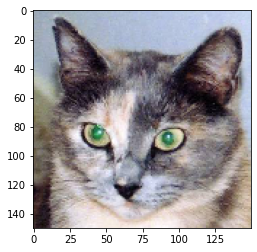

In [4]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

We require a model that outputs the activations of all convolution and pooling layers

Implementable with the `tensorflow.keras` class `Model` 

A `Model` is instantiated from an input tensor (or list of input tensors) and an output tensor (or list of output tensors)

These class models are more flexible than the `Sequential` model of our earlier topics

`models.Sequential()` instantiates a model that requires exactly one input and one output

`models.Model()` models can have multiple inputs and outputs - more in Topic 7: Advanced DL best practices

Our model has one input and 8 outputs, one output per layer activation:

In [5]:
from tensorflow.keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

The outputs are accessed by `model.predict()`

In [6]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


The activation of the first convolution layer has shape

In [7]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


A 148 x 148 feature map with 32 channels

Let's try visualizing the 3rd channel:

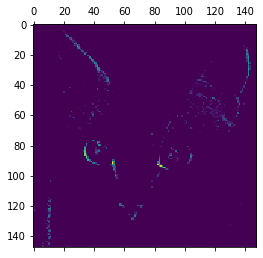

In [8]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis')
plt.show()

This channel appears to encode a diagonal edge detector

Let's try channel 19 (channels may vary, since the specific filters learned by convolution layers are not deterministic)

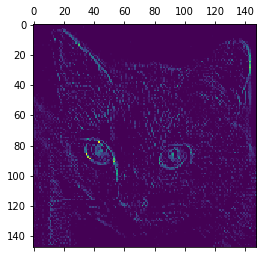

In [18]:
plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.show()

This one looks like a general edge detector

Now extract and plot every channel in each of our 8 activation maps - stack the results in one big image tensor, with channels stacked side by side.

In [ ]:
import tensorflow.keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            if(channel_image.std() > 0):
                channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

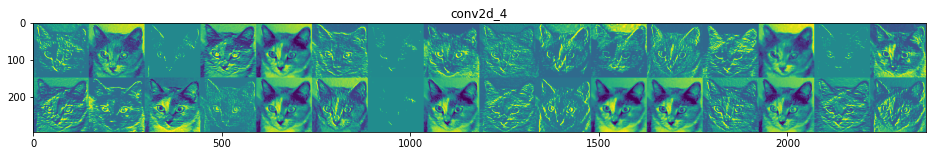

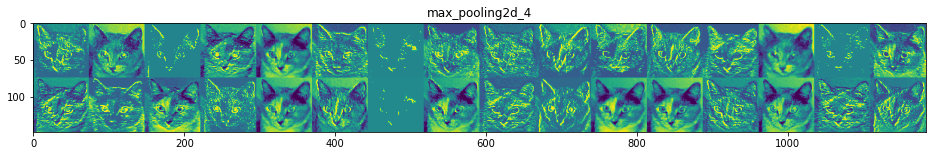

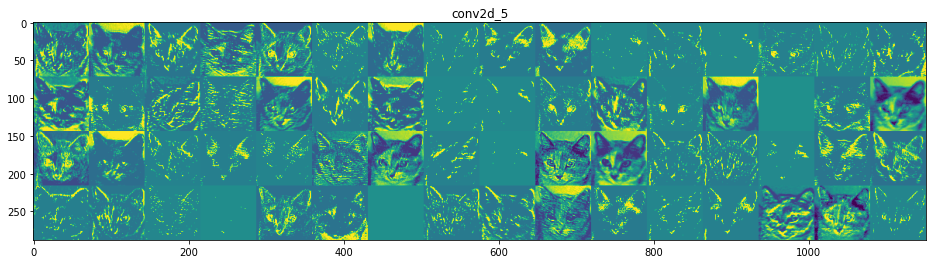

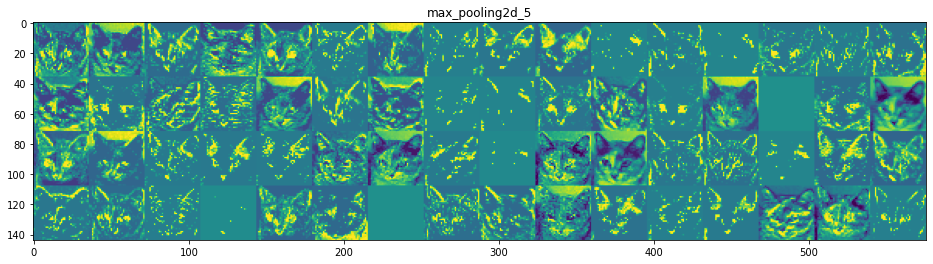

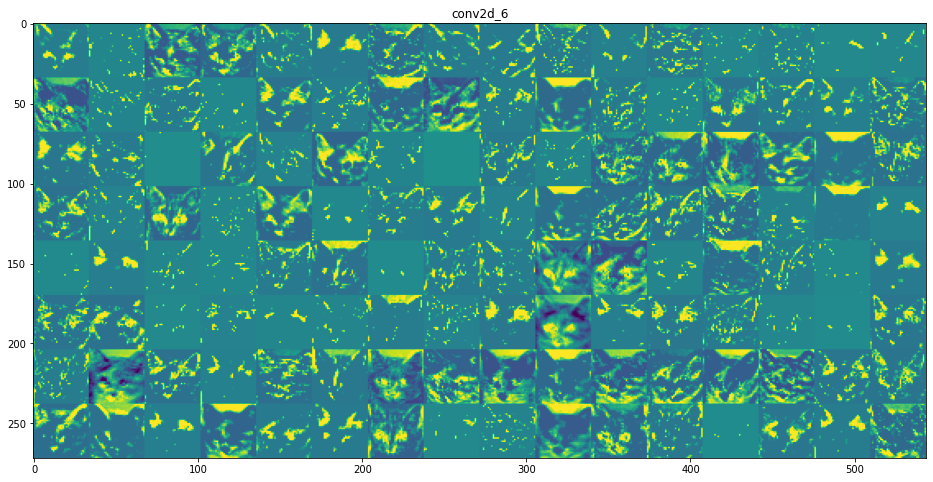

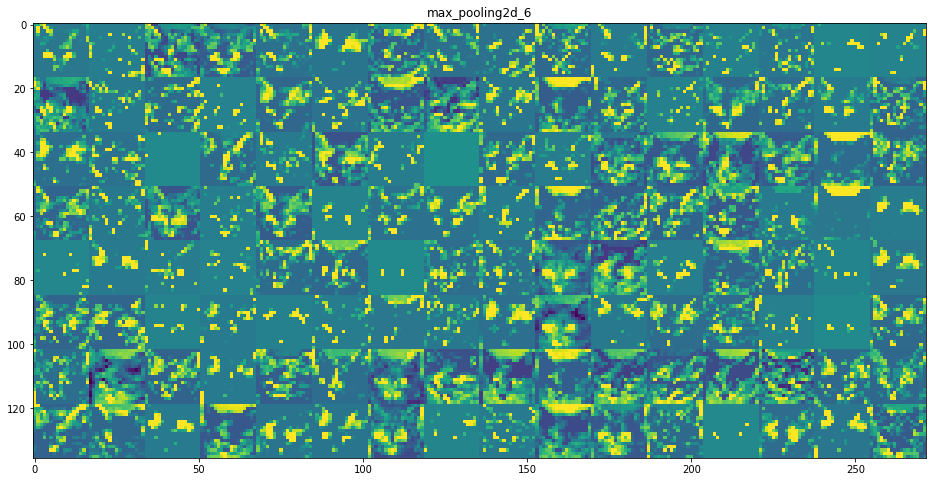

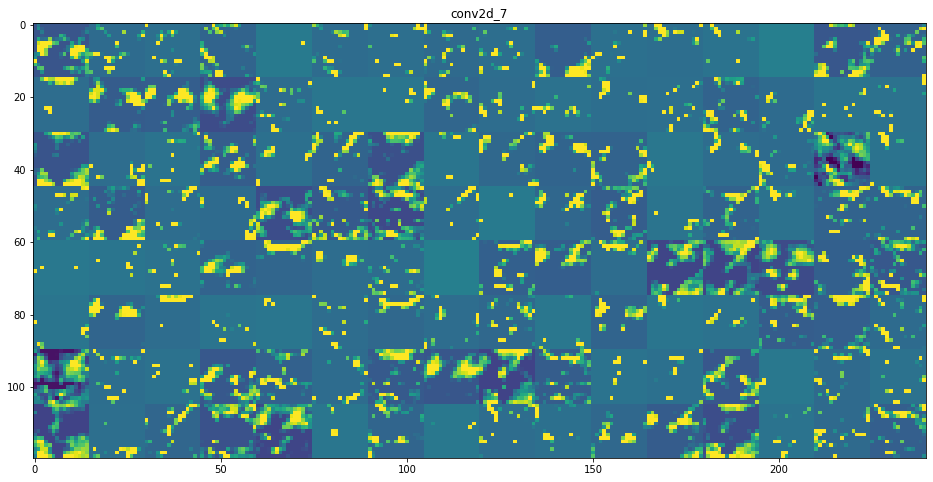

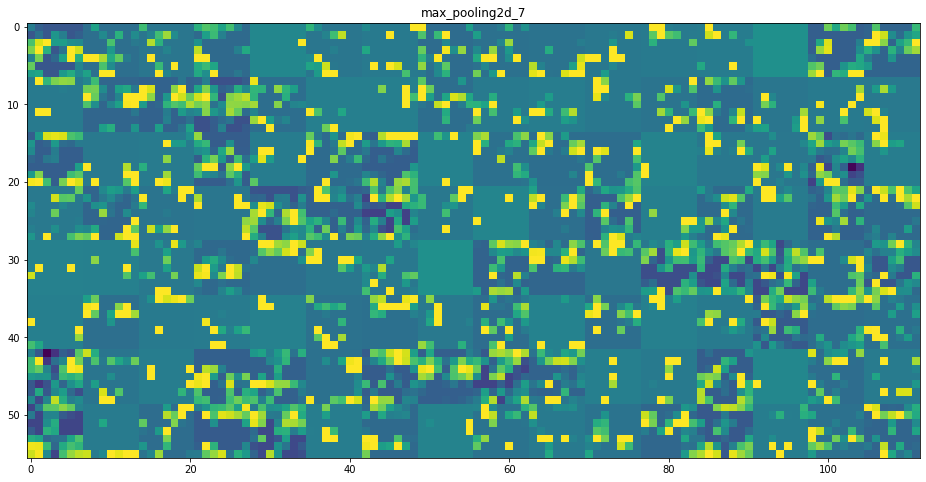

In [19]:
plt.show()

The first layer detects edges; activations retain almost all image information

Higher activations are increasingly abstract and begin encoding higher-level concepts such as 'cat ear' or 'dog eye
    
Original visual information decreases and information related to the class of the image increases with depth

All first layer filters are activated by the input image, but more and more filters in the following layers are blank - the pattern encoded by the filter isn't found in the input image.

A deep neural network effectively acts as an *information distillation pipeline*

Relevant information is distilled - magnified and refined - whilst irrelevant information is filtered out 

Somewhat analogous to humans perception: we can remember which abstract objects were present in a scene (bicycle, tree...) after only a quick glance, but we might fail to remember any specific appearance 

Draw a bicycle from memory right now - no looking on the internet

Do it!!

Experience tells me that very people get it even remotely right - actually the results are hilarious

But we have seen thousands of bicycles in our lifetime and might even own one!

Our brains transform visual input into high-level concepts (i.e. abstraction) while completely filtering out irrelevant visual detail

Your brain is an information distillation pipeline, transforming visual detail into high-level concepts (i.e. abstraction)

----

## 5.420 Visualising convnet filters

Inspect the filters learned by the convnet - what visual pattern causes a particular filter to respond

Start with a blank image and adjust the image so that the response of a each filter is maximised

Use gradient *ascent* this time because we are maximising

In [13]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [14]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element -- which is a tensor.

grads = K.gradients(loss, model.input)[0]

In [15]:
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [16]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [17]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [18]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    # x *= 255
    # x = np.clip(x, 0, 255).astype('uint8')
    
    return x

In [19]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

Let's visualise filter 0 in layer `block3_conv1` 

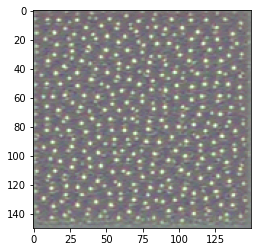

In [20]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

This filter responds to a polka dot pattern

Let's visualise the first 64 filters in the first layer of each convolution block (`block1_conv1, block2_conv1, block3_conv1, block4_conv1, block5_conv1`)

Arrange the outputs on a 8 x 8 grid of 

64 x 64 filter patterns...

In [ ]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

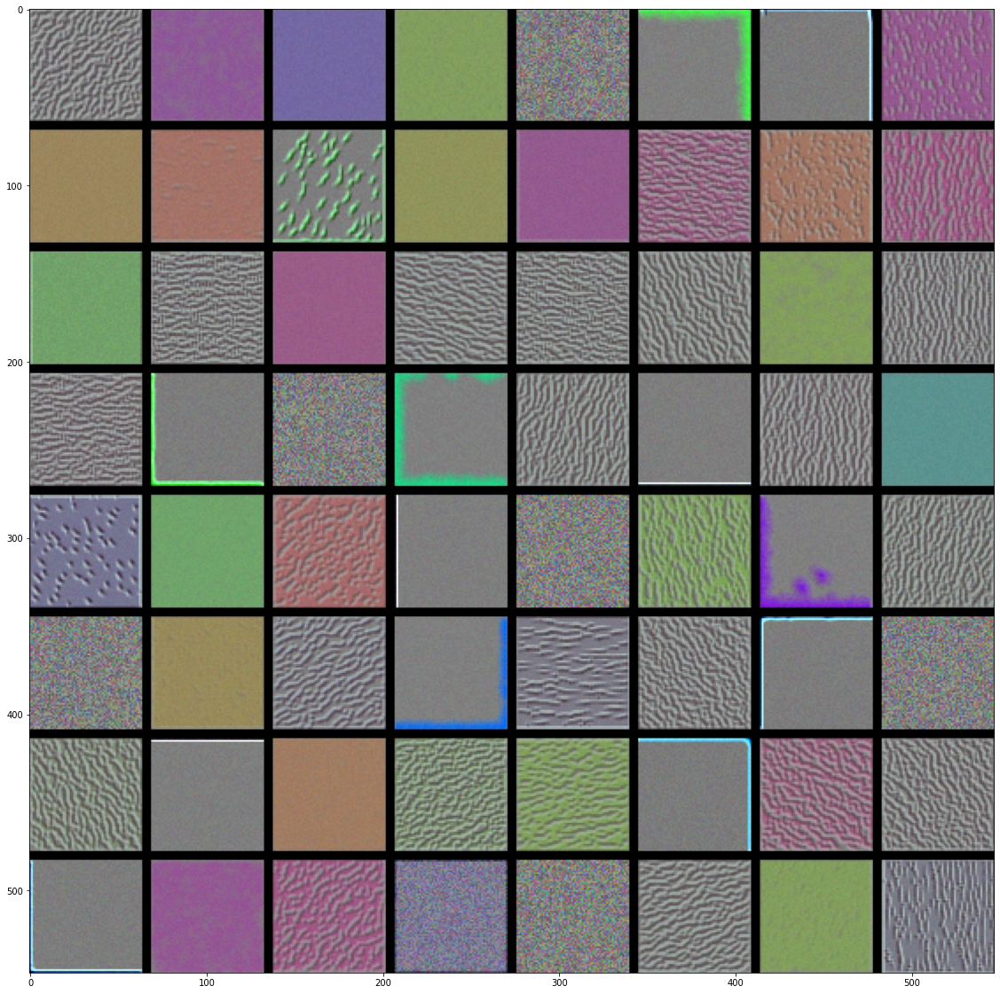

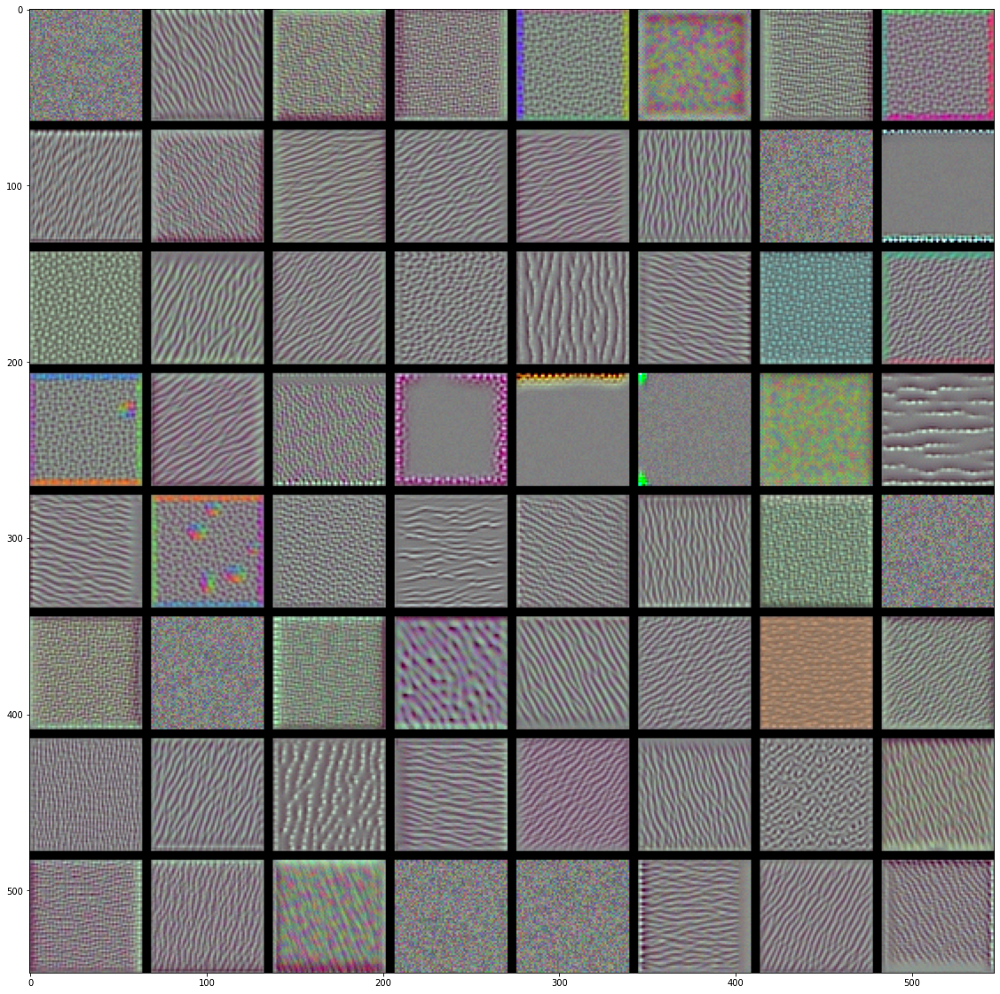

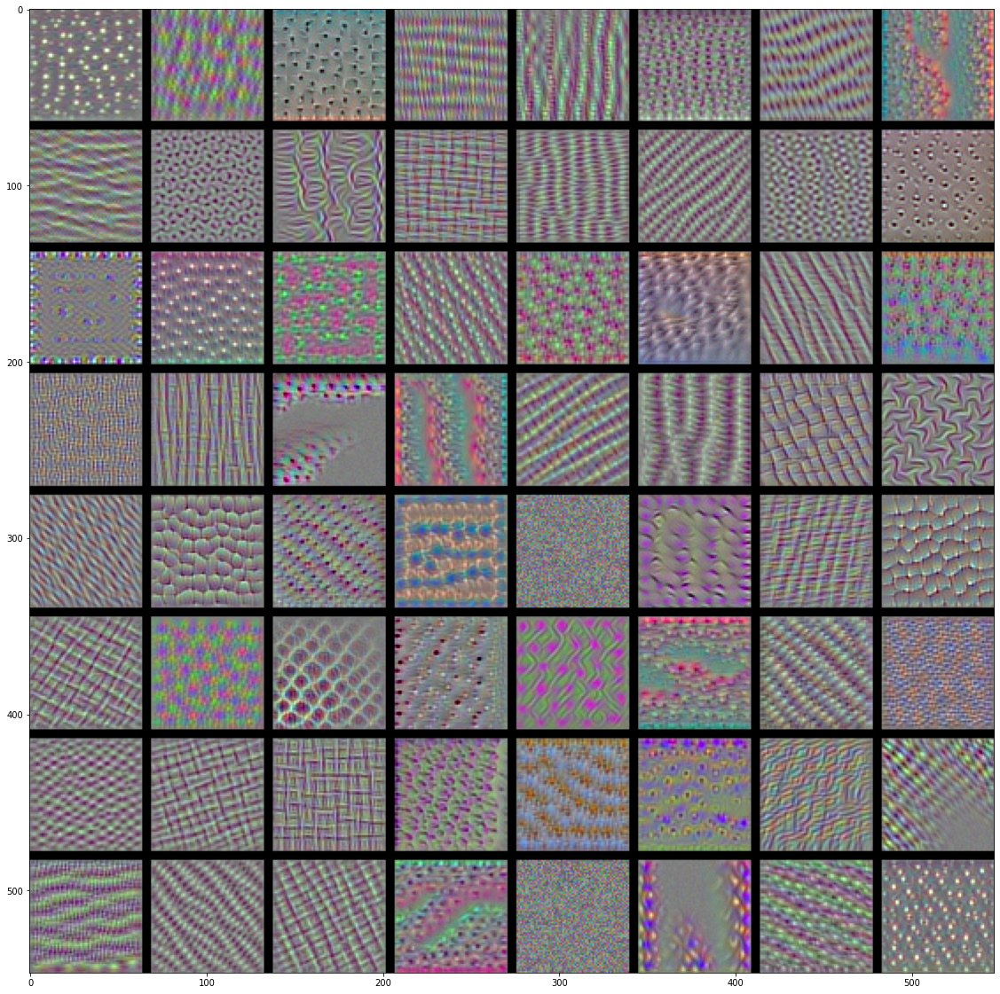

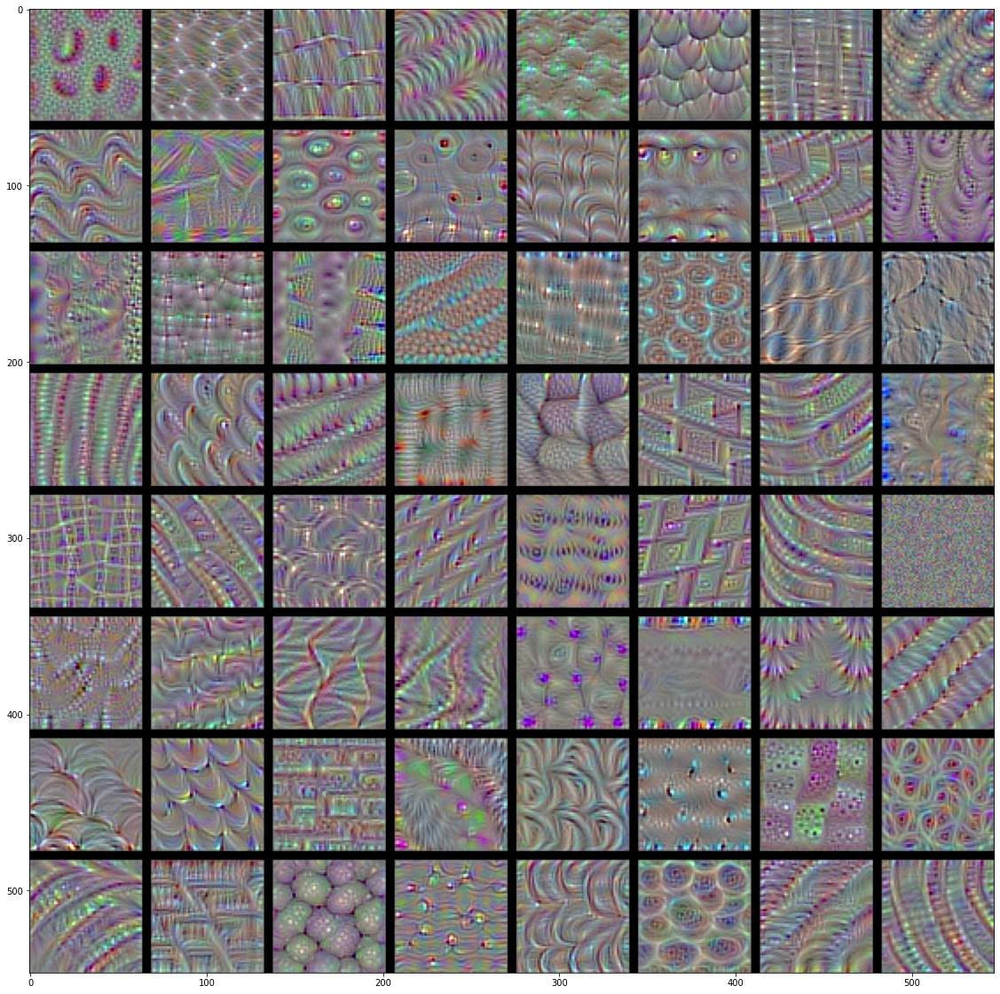

These filter visualizations tell us much about how convnets see the world 

Each layer in a convnet learns a collection of filters 

Layer inputs can be expressed as a combination of the filters 

Filters in the convnet filter banks get increasingly complex and refined as we go proceed along the pipeline:

- The first-layer filters (`block1_conv1`) encode simple directional edges and colors (or colored edges in some 
cases)

- `block2_conv1` filters encode simple textures made from combinations of edges and colors
    
- Higher-up filter activations start resembling textures found in natural images: feathers, eyes, leaves, etc.

----

## 5.430 Visualizing heatmaps of class activation

A heatmap - the part of an image that was important in the convnet's decision process - is useful for debugging misclassifications and for object localisation

For example: what parts of images in the Dogs vs Cats dataset are most dog-like?

The core idea behind Grad-CAM (gradient Class Activation Map) 

is that the gradient of the activation of a particular class with respect to the activation of the final conv layer is an indication of importance 

you can think of it as a kind of 'sensitivity' to specific image regions

In [22]:
from tensorflow.keras.applications.vgg16 import VGG16

K.clear_session()

# Note that we are including the densely-connected classifier on top;
# all previous times, we were discarding it.
model = VGG16(weights='imagenet')

Here is our example image - two African elephants:

![elephants](https://s3.amazonaws.com/book.keras.io/img/ch5/creative_commons_elephant.jpg)

Preprocess...

In [23]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# The local path to our target image
img_path = '/Users/timblackwell/documents/Goldsmiths/2021/Data Science/data/creative_commons_elephant.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

In [24]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n02504458', 'African_elephant', 0.90942115), ('n01871265', 'tusker', 0.08618289), ('n02504013', 'Indian_elephant', 0.004354583)]


In [25]:
np.argmax(preds[0])

386

The top-3 predictions:

* African elephant (92.5%)
* Tusker - an elephant with very long tusks (7%)
* Indian elephant (0.4%)

Run Grad-CAM:

In [26]:
# This is the "african elephant" entry in the prediction vector
african_elephant_output = model.output[:, 386]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('block5_conv3')

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

For visualization purpose, we will also normalize the heatmap between 0 and 1:

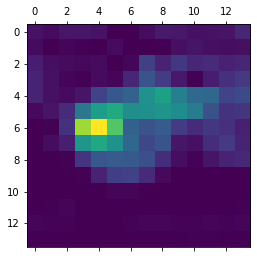

In [27]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Finally, we will use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained:

In [29]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('/Users/fchollet/Downloads/elephant_cam.jpg', superimposed_img)

False

![elephant cam](https://s3.amazonaws.com/book.keras.io/img/ch5/elephant_cam.jpg)

The heat map indicates why the network thought it had seen an African elephant, and where the elephant(s) is(are) located

It seems the ear and head shape of the elephant calf was important in this case - Indian elelphants have smaller ears and broader skulls

----

MIT Licence
 
Copyright (c) 2017-present François Chollet
 
Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:
 
The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.
 
THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.